# Manejo de Datos Faltantes: Exploración




## Configuración de ambiente de trabajo

In [ ]:
pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 5.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


In [ ]:
pip install pyjanitor matplotlib==3.5.1 missingno numpy pandas pyreadr seaborn session-info upsetplot==0.6.1

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 46.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.9/440.9 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 5.9 MB/s eta 0:00:00
  Created wheel for upsetplot: filename=UpSetPlot-0.6.1-py3-none-any.whl size=19063 sha256=9cebf2e3e40fa8631bc522e36715b0ceed6ef7e99f0e6ffef4330bb6f03c80aa
  Stored in directory: /root/.cache/pip/wheels/c6/a5/5c/49d553c478da59a455e100b9d5d690833622b9dab375cd2460
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=5f9233dee2393d73054bd54e13af64152187bb095db1f1eac152c01b3a4cad13
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9bd998d68a9b268765a
Successfully built upsetplot session-info
  Attempting uninstall: ma

## Importar librerías

In [ ]:
import janitor
import matplotlib.pyplot as plt
import missingno
import numpy as np
import pandas as pd
import pyreadr
import seaborn as sns
import session_info
import upsetplot

## Importar funciones personalizadas

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !ls drive/MyDrive/Master/TFM/pandas-missing-extension.ipynb
%run drive/MyDrive/Master/TFM/pandas-missing-extension.ipynb

In [ ]:
# %run pandas-missing-extension.ipynb

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Configurar el aspecto general de las gráficas del proyecto

In [ ]:
%matplotlib inline

sns.set(
    rc={
        "figure.figsize": (10, 10)
    }
)

sns.set_style("whitegrid")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Cargar datos

In [ ]:
df = pd.read_csv('/content/bigx_users_sakai.csv')
df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,tasignaturas,marca_abandono,key_id,tcursos_events_peranalisis,tcursos_events_sum2s,tcursos_events_prom2s,tcursos_events_diff2s,tcursos_events_var2s,tcursos_events_max2s,tcursos_events_min2s,...,tt_login_sem3,tt_login_median3s,tt_login_sum4s,tt_login_prom4s,tt_login_diff4s,tt_login_var4s,tt_login_max4s,tt_login_min4s,tt_login_sem4,tt_login_median4s
0,9,0,PER1520-416-283_1470aabe-2784-4aeb-b92b-a4df36...,7.0,12.0,6.0,2.0,0.400,7.0,5.0,...,73.0,73.0,347.0,86.75,37.0,0.430,123.0,65.0,86.0,79.5
1,4,0,PER1520-416-283_1d1ff527-d0dd-46bb-80e8-0e0415...,7.0,14.0,7.0,0.0,0.000,7.0,7.0,...,36.0,30.0,119.0,29.75,-17.0,-0.486,36.0,18.0,35.0,32.5
2,2,0,PER1520-416-283_224ea337-1a8a-4939-92e9-b89441...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,32.0,47.0,164.0,41.00,21.0,0.656,53.0,32.0,32.0,39.5
3,9,0,PER1520-416-283_337303e9-49d5-49c6-b62b-44d84a...,6.0,11.0,5.5,1.0,0.200,6.0,5.0,...,12.0,8.0,27.0,6.75,3.0,1.500,12.0,2.0,2.0,6.5
4,9,0,PER1520-416-283_362a0895-a707-4155-ae77-86f371...,6.0,12.0,6.0,0.0,0.000,6.0,6.0,...,49.0,47.0,159.0,39.75,-15.0,-0.385,49.0,24.0,39.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,8,0,PER3561-379-379__379_b56dc7d5-094d-40b6-90ce-1...,7.0,14.0,7.0,0.0,0.000,7.0,7.0,...,14.0,37.0,150.0,37.50,34.0,11.333,96.0,3.0,3.0,25.5
4007,7,0,PER3561-379-379__379_bee9a0ee-081f-4356-bcca-6...,5.0,12.0,6.0,-2.0,-0.286,7.0,5.0,...,17.0,37.0,102.0,25.50,48.0,NaN,48.0,0.0,0.0,37.0
4008,7,0,PER3561-379-379__379_cb4aa675-ebdf-4391-962e-d...,7.0,13.0,6.5,1.0,0.167,7.0,6.0,...,11.0,11.0,34.0,8.50,4.0,1.000,11.0,4.0,4.0,9.5
4009,7,0,PER3561-379-379__379_e4ac35f7-e080-4654-9b9f-f...,6.0,12.0,6.0,0.0,0.000,6.0,6.0,...,20.0,31.0,113.0,28.25,10.0,0.476,41.0,20.0,21.0,26.0


### Verificar carga

In [ ]:
df.head(2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,tasignaturas,marca_abandono,key_id,tcursos_events_peranalisis,tcursos_events_sum2s,tcursos_events_prom2s,tcursos_events_diff2s,tcursos_events_var2s,tcursos_events_max2s,tcursos_events_min2s,...,tt_login_sem3,tt_login_median3s,tt_login_sum4s,tt_login_prom4s,tt_login_diff4s,tt_login_var4s,tt_login_max4s,tt_login_min4s,tt_login_sem4,tt_login_median4s
0,9,0,PER1520-416-283_1470aabe-2784-4aeb-b92b-a4df36...,7.0,12.0,6.0,2.0,0.4,7.0,5.0,...,73.0,73.0,347.0,86.75,37.0,0.430,123.0,65.0,86.0,79.5
1,4,0,PER1520-416-283_1d1ff527-d0dd-46bb-80e8-0e0415...,7.0,14.0,7.0,0.0,0.0,7.0,7.0,...,36.0,30.0,119.0,29.75,-17.0,-0.486,36.0,18.0,35.0,32.5


In [ ]:
df.info()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4011 entries, 0 to 4010
Columns: 1553 entries, tasignaturas to tt_login_median4s
dtypes: float64(1550), int64(2), object(1)
memory usage: 47.5+ MB


In [ ]:
dfstats = df.describe().T
columnas = dfstats[dfstats['min'] == 0][dfstats['max'] == 0].index
df2= df.drop(columns=columnas)
df2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-7-080de6025409>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  columnas = dfstats[dfstats['min'] == 0][dfstats['max'] == 0].index


,tasignaturas,marca_abandono,key_id,tcursos_events_peranalisis,tcursos_events_sum2s,tcursos_events_prom2s,tcursos_events_diff2s,tcursos_events_var2s,tcursos_events_max2s,tcursos_events_min2s,...,tt_login_sem3,tt_login_median3s,tt_login_sum4s,tt_login_prom4s,tt_login_diff4s,tt_login_var4s,tt_login_max4s,tt_login_min4s,tt_login_sem4,tt_login_median4s
0,9,0,PER1520-416-283_1470aabe-2784-4aeb-b92b-a4df36...,7.0,12.0,6.0,2.0,0.400,7.0,5.0,...,73.0,73.0,347.0,86.75,37.0,0.430,123.0,65.0,86.0,79.5
1,4,0,PER1520-416-283_1d1ff527-d0dd-46bb-80e8-0e0415...,7.0,14.0,7.0,0.0,0.000,7.0,7.0,...,36.0,30.0,119.0,29.75,-17.0,-0.486,36.0,18.0,35.0,32.5
2,2,0,PER1520-416-283_224ea337-1a8a-4939-92e9-b89441...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,32.0,47.0,164.0,41.00,21.0,0.656,53.0,32.0,32.0,39.5
3,9,0,PER1520-416-283_337303e9-49d5-49c6-b62b-44d84a...,6.0,11.0,5.5,1.0,0.200,6.0,5.0,...,12.0,8.0,27.0,6.75,3.0,1.500,12.0,2.0,2.0,6.5
4,9,0,PER1520-416-283_362a0895-a707-4155-ae77-86f371...,6.0,12.0,6.0,0.0,0.000,6.0,6.0,...,49.0,47.0,159.0,39.75,-15.0,-0.385,49.0,24.0,39.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,8,0,PER3561-379-379__379_b56dc7d5-094d-40b6-90ce-1...,7.0,14.0,7.0,0.0,0.000,7.0,7.0,...,14.0,37.0,150.0,37.50,34.0,11.333,96.0,3.0,3.0,25.5
4007,7,0,PER3561-379-379__379_bee9a0ee-081f-4356-bcca-6...,5.0,12.0,6.0,-2.0,-0.286,7.0,5.0,...,17.0,37.0,102.0,25.50,48.0,NaN,48.0,0.0,0.0,37.0
4008,7,0,PER3561-379-379__379_cb4aa675-ebdf-4391-962e-d...,7.0,13.0,6.5,1.0,0.167,7.0,6.0,...,11.0,11.0,34.0,8.50,4.0,1.000,11.0,4.0,4.0,9.5
4009,7,0,PER3561-379-379__379_e4ac35f7-e080-4654-9b9f-f...,6.0,12.0,6.0,0.0,0.000,6.0,6.0,...,20.0,31.0,113.0,28.25,10.0,0.476,41.0,20.0,21.0,26.0


## Tabulación de valores faltantes

In [ ]:
df2.isna().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


tasignaturas                    0
marca_abandono                  0
key_id                          0
tcursos_events_peranalisis    266
tcursos_events_sum2s          266
                             ... 
tt_login_var4s                552
tt_login_max4s                185
tt_login_min4s                185
tt_login_sem4                 185
tt_login_median4s             185
Length: 995, dtype: int64

### Resúmenes básicos de valores faltantes

In [ ]:
print('Tamaño filas x columnas:')
print(df2.shape)

print('Numero de valores completos:')
print(df2.missing.number_complete())

print('Valores faltantes:')
print(df2.missing.number_missing())

print('Resumen: porcentaje de valores nulos por columna.')
resumen_por_caso = df2.missing.missing_variable_summary()
resumen_por_caso

Tamaño filas x columnas:
(4011, 995)
Numero de valores completos:
3000374
Valores faltantes:
990571
Resumen: porcentaje de valores nulos por columna.


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,variable,n_missing,n_cases,pct_missing
0,tasignaturas,0,4011,0.000000
1,marca_abandono,0,4011,0.000000
2,key_id,0,4011,0.000000
3,tcursos_events_peranalisis,266,4011,6.631763
4,tcursos_events_sum2s,266,4011,6.631763
...,...,...,...,...
990,tt_login_var4s,552,4011,13.762154
991,tt_login_max4s,185,4011,4.612316
992,tt_login_min4s,185,4011,4.612316
993,tt_login_sem4,185,4011,4.612316


In [ ]:
# print('Tabulación:')
# df2.missing.missing_variable_table()

print('Valores perdidos por agrupaciones de columna (50 agrupaciones)')
df2.missing.missing_case_summary()

# df2.missing.missing_case_table()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Valores perdidos por agrupaciones de columna (50 agrupaciones)


,case,n_missing,pct_missing
0,0,150,15.045135
1,1,140,14.042126
2,2,967,96.990973
3,3,150,15.045135
4,4,380,38.114343
...,...,...,...
4006,4006,153,15.346038
4007,4007,395,39.618857
4008,4008,154,15.446339
4009,4009,158,15.847543


In [ ]:
resumen_por_caso[resumen_por_caso['pct_missing'] > 90]
df2.missing.missing_variable_summary()
(
    df2
    .missing
    .missing_variable_span(
        variable="tres_up_otros_var4s",
        span_every=50
    )
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,span_counter,n_missing,n_complete,pct_missing,pct_complete
0,0,50,0,100.0,0.0
1,1,50,0,100.0,0.0
2,2,50,0,100.0,0.0
3,3,50,0,100.0,0.0
4,4,49,1,98.0,2.0
...,...,...,...,...,...
76,76,50,0,100.0,0.0
77,77,50,0,100.0,0.0
78,78,50,0,100.0,0.0
79,79,50,0,100.0,0.0


In [ ]:

(
    df2
    .missing
    .missing_variable_run(
        variable="tres_up_otros_var4s"
    )
)



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,run_length,is_na
0,201,missing
1,1,complete
2,69,missing
3,1,complete
4,277,missing
5,1,complete
6,67,missing
7,1,complete
8,1940,missing
9,1,complete


## Visualización inicial de valores faltantes

### Variable

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


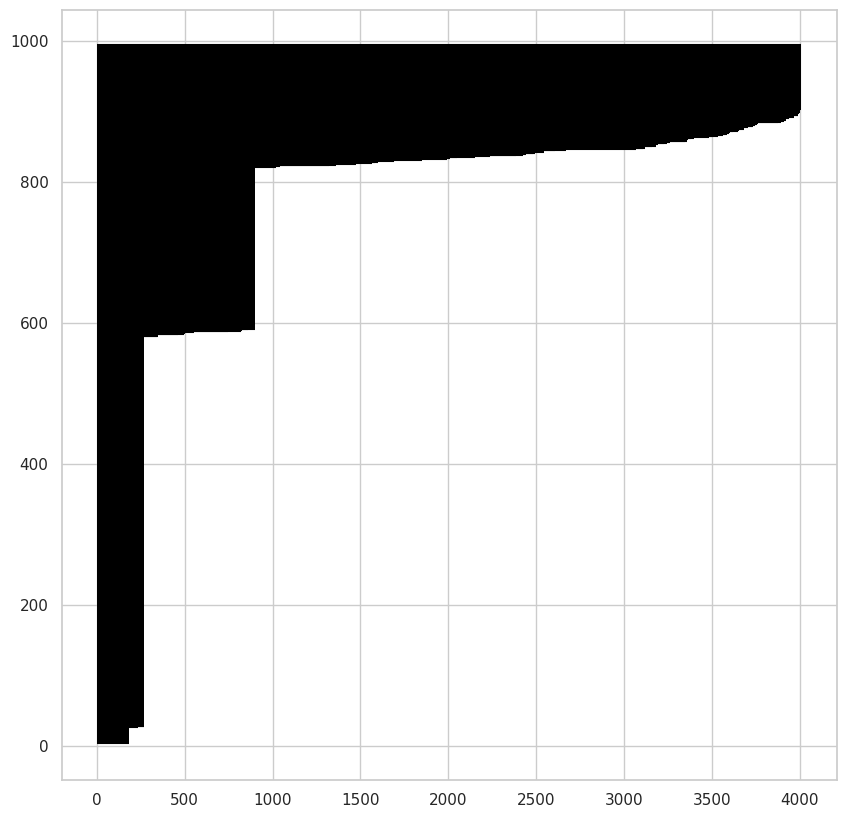

In [ ]:
try:
  df2.missing.missing_variable_plot()
except:
  pass


In [ ]:
df2.describe().T[df2.describe().T['count'] > 3500]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count,mean,std,min,25%,50%,75%,max
tasignaturas,4011.0,7.027923,2.992462,1.0,5.0,8.0,8.0,13.0
marca_abandono,4011.0,0.143106,0.350225,0.0,0.0,0.0,0.0,1.0
tcursos_events_peranalisis,3745.0,5.342857,1.912326,1.0,4.0,6.0,7.0,10.0
tcursos_events_sum2s,3745.0,10.934846,3.630507,1.0,8.0,12.0,14.0,20.0
tcursos_events_prom2s,3745.0,5.467423,1.815254,0.5,4.0,6.0,7.0,10.0
...,...,...,...,...,...,...,...,...
tt_login_diff4s,3826.0,22.343440,125.166755,-614.0,-2.0,9.0,27.0,4425.0
tt_login_max4s,3826.0,75.836644,171.093487,1.0,21.0,38.0,73.0,4448.0
tt_login_min4s,3826.0,22.352849,66.526574,0.0,3.0,9.0,20.0,1703.0
tt_login_sem4,3826.0,32.755881,85.906969,0.0,4.0,13.0,31.0,2076.0


In [ ]:
missingno.bar(df=df2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:306: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  mesh = ax.pcolormesh(self.plot_data, cmap=self.cmap, **kws)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:316: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = ax.figure.colorbar(mesh, cax, ax, **self.cbar_kws)


<AxesSubplot:>

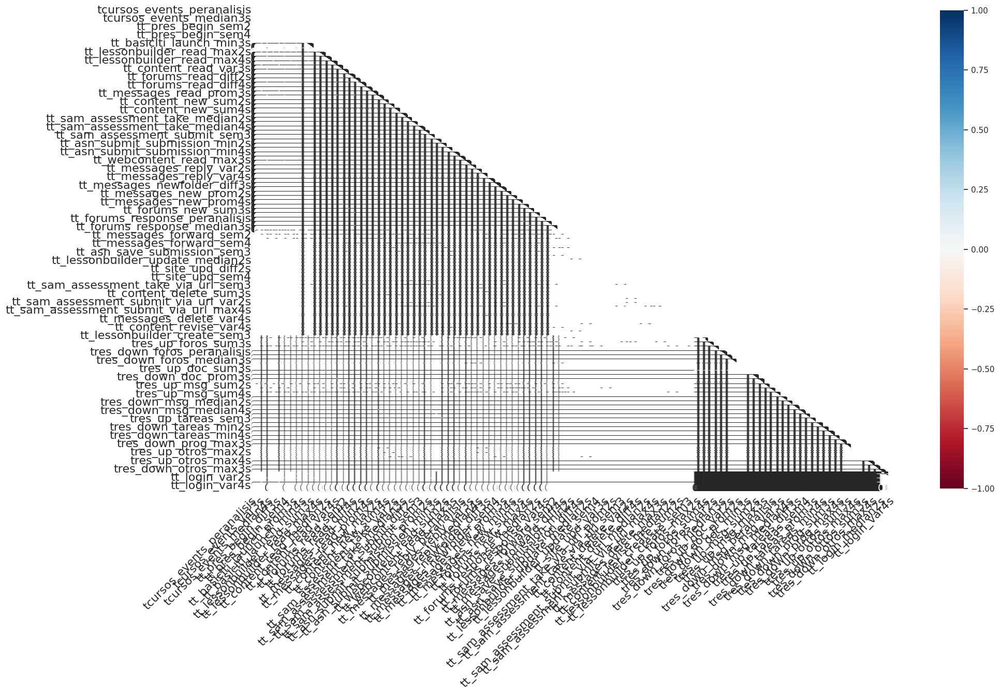

In [ ]:
# missingno.heatmap(df=df2)

### Casos / Observaciones / Filas

In [ ]:
colBorrar = []
for x in df2.columns:
  if 'var' in x:
    colBorrar.append(x)

df = df2.drop(columns=colBorrar)
df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,tasignaturas,marca_abandono,key_id,tcursos_events_peranalisis,tcursos_events_sum2s,tcursos_events_prom2s,tcursos_events_diff2s,tcursos_events_max2s,tcursos_events_min2s,tcursos_events_sem2,...,tt_login_min3s,tt_login_sem3,tt_login_median3s,tt_login_sum4s,tt_login_prom4s,tt_login_diff4s,tt_login_max4s,tt_login_min4s,tt_login_sem4,tt_login_median4s
0,9,0,PER1520-416-283_1470aabe-2784-4aeb-b92b-a4df36...,7.0,12.0,6.0,2.0,7.0,5.0,5.0,...,65.0,73.0,73.0,347.0,86.75,37.0,123.0,65.0,86.0,79.5
1,4,0,PER1520-416-283_1d1ff527-d0dd-46bb-80e8-0e0415...,7.0,14.0,7.0,0.0,7.0,7.0,7.0,...,18.0,36.0,30.0,119.0,29.75,-17.0,36.0,18.0,35.0,32.5
2,2,0,PER1520-416-283_224ea337-1a8a-4939-92e9-b89441...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,32.0,32.0,47.0,164.0,41.00,21.0,53.0,32.0,32.0,39.5
3,9,0,PER1520-416-283_337303e9-49d5-49c6-b62b-44d84a...,6.0,11.0,5.5,1.0,6.0,5.0,5.0,...,5.0,12.0,8.0,27.0,6.75,3.0,12.0,2.0,2.0,6.5
4,9,0,PER1520-416-283_362a0895-a707-4155-ae77-86f371...,6.0,12.0,6.0,0.0,6.0,6.0,6.0,...,24.0,49.0,47.0,159.0,39.75,-15.0,49.0,24.0,39.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,8,0,PER3561-379-379__379_b56dc7d5-094d-40b6-90ce-1...,7.0,14.0,7.0,0.0,7.0,7.0,7.0,...,14.0,14.0,37.0,150.0,37.50,34.0,96.0,3.0,3.0,25.5
4007,7,0,PER3561-379-379__379_bee9a0ee-081f-4356-bcca-6...,5.0,12.0,6.0,-2.0,7.0,5.0,7.0,...,17.0,17.0,37.0,102.0,25.50,48.0,48.0,0.0,0.0,37.0
4008,7,0,PER3561-379-379__379_cb4aa675-ebdf-4391-962e-d...,7.0,13.0,6.5,1.0,7.0,6.0,6.0,...,8.0,11.0,11.0,34.0,8.50,4.0,11.0,4.0,4.0,9.5
4009,7,0,PER3561-379-379__379_e4ac35f7-e080-4654-9b9f-f...,6.0,12.0,6.0,0.0,6.0,6.0,6.0,...,20.0,20.0,31.0,113.0,28.25,10.0,41.0,20.0,21.0,26.0


In [ ]:
missingno.bar(df=df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

In [ ]:
df.to_csv('df.csv')

In [ ]:
df2.missing.missing_case_plot()

## Parentesis

In [ ]:
import pandas as pd
df = pd.read_csv('/content/df.csv')
pd.Series(df.key_id.unique())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0       PER1520-416-283_1470aabe-2784-4aeb-b92b-a4df36...
1       PER1520-416-283_1d1ff527-d0dd-46bb-80e8-0e0415...
2       PER1520-416-283_224ea337-1a8a-4939-92e9-b89441...
3       PER1520-416-283_337303e9-49d5-49c6-b62b-44d84a...
4       PER1520-416-283_362a0895-a707-4155-ae77-86f371...
                              ...                        
4006    PER3561-379-379__379_b56dc7d5-094d-40b6-90ce-1...
4007    PER3561-379-379__379_bee9a0ee-081f-4356-bcca-6...
4008    PER3561-379-379__379_cb4aa675-ebdf-4391-962e-d...
4009    PER3561-379-379__379_e4ac35f7-e080-4654-9b9f-f...
4010    PER3561-379-379__379_f0ba298b-8fce-4e5a-a458-a...
Length: 4011, dtype: object

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:306: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  mesh = ax.pcolormesh(self.plot_data, cmap=self.cmap, **kws)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:316: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = ax.figure.colorbar(mesh, cax, ax, **self.cbar_kws)


<AxesSubplot:>

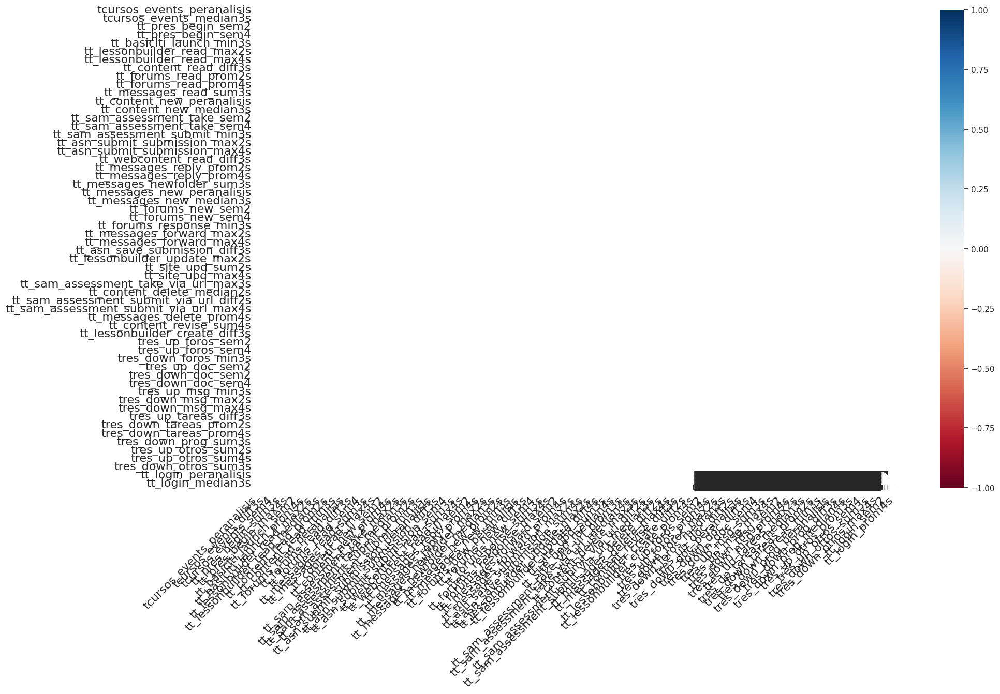

In [ ]:
# missingno.heatmap(df=df)

## Codificación de valores faltantes

### ¿Cómo encontrar los valores comúnmente asociados a valores faltantes?

In [ ]:
df2.missing.number_missing()

#### Revisar tipos de datos

In [ ]:
df2.dtypes

#### Revisar valores únicos de los datos

In [ ]:
df22 = df2.drop(columns=['key_id', 'marca_abandono'])
(
    df2
    .select_dtypes(object)
    .apply(pd.unique)
)

## Conversión de valores faltantes implícitos a explícitos

<div class="alert alert-warning", role="alert">
    <b style="font-size: 1.5em;">🚧 Advertencia</b>
    <br>
    <br>
    <p>
        <i>
        "<b>Implícito</b> se refiere a todo aquello que se entiende que está incluido
        pero sin ser expresado de forma directa o explícitamente."
        </i>
    </p>
    <p>
    Un <code>valor faltante implícito</code> indica que el valor faltante <b>debería estar incluido</b>
    en el conjunto de datos del análisis, <b>sin que éste lo diga</b> o lo <b>especifique</b>.
    Por lo general, son valores que podemos encontrar al pivotar nuestros datos
    o contabilizar el número de apariciones de combinaciones de las variables de estudio.
    </p>
</div>

In [ ]:
implicit_to_explicit_df = pd.DataFrame.from_dict(
    data=df22
)

implicit_to_explicit_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,tasignaturas,tcursos_events_peranalisis,tcursos_events_sum2s,tcursos_events_prom2s,tcursos_events_diff2s,tcursos_events_var2s,tcursos_events_max2s,tcursos_events_min2s,tcursos_events_sem2,tcursos_events_median2s,...,tt_login_sem3,tt_login_median3s,tt_login_sum4s,tt_login_prom4s,tt_login_diff4s,tt_login_var4s,tt_login_max4s,tt_login_min4s,tt_login_sem4,tt_login_median4s
0,9,7.0,12.0,6.0,2.0,0.400,7.0,5.0,5.0,6.0,...,73.0,73.0,347.0,86.75,37.0,0.430,123.0,65.0,86.0,79.5
1,4,7.0,14.0,7.0,0.0,0.000,7.0,7.0,7.0,7.0,...,36.0,30.0,119.0,29.75,-17.0,-0.486,36.0,18.0,35.0,32.5
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,32.0,47.0,164.0,41.00,21.0,0.656,53.0,32.0,32.0,39.5
3,9,6.0,11.0,5.5,1.0,0.200,6.0,5.0,5.0,5.5,...,12.0,8.0,27.0,6.75,3.0,1.500,12.0,2.0,2.0,6.5
4,9,6.0,12.0,6.0,0.0,0.000,6.0,6.0,6.0,6.0,...,49.0,47.0,159.0,39.75,-15.0,-0.385,49.0,24.0,39.0,43.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4006,8,7.0,14.0,7.0,0.0,0.000,7.0,7.0,7.0,7.0,...,14.0,37.0,150.0,37.50,34.0,11.333,96.0,3.0,3.0,25.5
4007,7,5.0,12.0,6.0,-2.0,-0.286,7.0,5.0,7.0,6.0,...,17.0,37.0,102.0,25.50,48.0,NaN,48.0,0.0,0.0,37.0
4008,7,7.0,13.0,6.5,1.0,0.167,7.0,6.0,6.0,6.5,...,11.0,11.0,34.0,8.50,4.0,1.000,11.0,4.0,4.0,9.5
4009,7,6.0,12.0,6.0,0.0,0.000,6.0,6.0,6.0,6.0,...,20.0,31.0,113.0,28.25,10.0,0.476,41.0,20.0,21.0,26.0


### Estrategias para la identificación de valores faltantes implícitos

#### Pivotar la tabla de datos

In [ ]:
(
    implicit_to_explicit_df
    .pivot_wider(
        index="name",
        names_from="time",
        values_from="value"
    )
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/pandas_flavor/register.py:157: FutureWarning: This function will be deprecated in a 1.x release. Please use `pd.DataFrame.pivot` instead.
  return method(self._obj, *args, **kwargs)


KeyError: "No match was returned for 'name'"

#### Cuantificar ocurrencias de n-tuplas

In [ ]:
(
    implicit_to_explicit_df
    .value_counts(
        subset=["name"]
    )
    .reset_index(name="n")
    .query("n < 2")
)

### Exponer filas faltantes implícitas a explícitas

<div class="alert alert-info">
    <b style="font-size: 1.5em;">📘 Información</b>
    <p>
       <a href="https://pyjanitor-devs.github.io/pyjanitor/api/functions/#janitor.functions.complete.complete", class="alert-link"><code>janitor.complete()</code></a> está modelada a partir de la función <a href="https://tidyr.tidyverse.org/reference/complete.html", class="alert-link"><code>complete()</code></a> del paquete <a href="https://tidyr.tidyverse.org/index.html", class="alert-link"><code>tidyr</code></a> y es un <i>wrapper</i> alrededor de <a href="https://pyjanitordevs.github.io/pyjanitor/api/functions/#janitor.functions.expand_grid.expand_grid", class="alert-link"><code>janitor.expand_grid()</code></a>, <a href="https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html", class="alert-link"><code>pd.merge()</code></a> y <a href="https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html", class="alert-link"><code>pd.fillna()</code></a>. En cierto modo, es lo contrario de <a href="https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dropna.html", class="alert-link"><code>pd.dropna()</code></a>, ya que expone implícitamente las filas que faltan.
    </p>
    <p>
    Son posibles combinaciones de nombres de columnas o una lista/tupla de nombres de columnas, o incluso un  diccionario de nombres de columna y nuevos valores.
    </p>
    <p>
    Las columnas <a href="https://pandas.pydata.org/docs/user_guide/advanced.html"><code>MultiIndex</code></a> no son complatibles.
    </p>
</div>

#### Exponer n-tuplas de valores faltantes

Ejemplo, encontrar los pares faltantes de `name` y `time`.

In [ ]:
(
    implicit_to_explicit_df
    .complete(
        "name",
        "time",
    )
)

#### Limitar la exposición de n-tuplas de valores faltantes

In [ ]:
(
    implicit_to_explicit_df
    # pyjanitor
    .complete(
        {"name": ["lynn", "zelda"]},
        {"time": ["morning", "afternoon"]},
        sort=True
    )
)

#### Rellenar los valores faltantes

In [ ]:
(
    implicit_to_explicit_df
    # pyjanitor
    .complete(
        "name",
        "time",
        fill_value=np.nan
    )
)

#### Limitar el rellenado de valores faltantes implícitos

In [ ]:
(
    implicit_to_explicit_df
    # pyjanitor
    .complete(
        "name",
        "time",
        fill_value=0,
        explicit=False
    )
)

## Tipos de valores faltantes

In [ ]:
df2.missing.missing_variable_plot()

In [ ]:
diabetes_df[diabetes_df.columns[1:6]] = diabetes_df[diabetes_df.columns[1:6]].replace(0, np.nan)
diabetes_df.missing.missing_variable_plot()

### _Missing Completely At Random_ (MCAR)

In [ ]:
(
    df2
    .missing.sort_variables_by_missingness()
    .pipe(missingno.matrix)
)

### _Missing At Random_ (MAR)

In [ ]:
(
    diabetes_df
    .missing.sort_variables_by_missingness()
    .sort_values(by = "blood_pressure")
    .pipe(missingno.matrix)
)

### _Missing Not At Random_ (MNAR)

In [ ]:
(
    diabetes_df
    .missing.sort_variables_by_missingness()
    .sort_values("insulin")
    .pipe(missingno.matrix)
)

## Concepto y aplicación de la matriz de sombras (_i.e._, _shadow matrix_)

 ### Construcción de la matriz de sombras

In [ ]:
(
    df2
    .isna()
    .replace({
        False: "Not missing",
        True: "Missing"
    })
    .add_suffix("_NA")
    .pipe(
        lambda shadow_matrix: pd.concat(
            [df, shadow_matrix],
            axis="columns"
        )
    )
)

### Utilizar función de utilería `bind_shadow_matrix()`

In [ ]:
(
    df2
    .missing
    .bind_shadow_matrix(only_missing = True)
)

### Explorar estadísticos utilizando las nuevas columnas de la matriz de sombras

In [ ]:
(
    df
    .missing
    .bind_shadow_matrix(only_missing=True)
    .groupby(["weight_lbs_NA"])
    ["age"]
    .describe()
    .reset_index()
)

## Visualización de valores faltantes en una variable

In [ ]:
(
    df
    .missing
    .bind_shadow_matrix(only_missing=True)
    .pipe(
        lambda df: (
            sns.displot(
                data=df,
                x="age",
                hue="weight_lbs_NA",
                kind="kde"
            )
        )
    )
)

In [ ]:
(
    df
    .missing
    .bind_shadow_matrix(only_missing=True)
    .pipe(
        lambda df: (
            sns.boxenplot(
                data=df,
                x="weight_lbs_NA",
                y="age",
            )
        )
    )
)

In [ ]:
(
    df
    .missing
    .bind_shadow_matrix(only_missing=True)
    .pipe(
        lambda df: (
            sns.displot(
                data=df,
                x="age",
                col="weight_lbs_NA",
                facet_kws={
                    "sharey": False
                }
            )
        )
    )
)

In [ ]:
(
    df
    .missing
    .bind_shadow_matrix(only_missing=True)
    .pipe(
        lambda df: (
            sns.displot(
                data=df,
                x="age",
                col="marital_NA",
                row="weight_lbs_NA"
            )
        )
    )
)

## Visualización de valores faltantes en dos variables

In [ ]:
def column_fill_with_dummies(
    column: pd.Series,
    proportion_below: float=0.10,
    jitter: float=0.075,
    seed: int=42
) -> pd.Series:

    column = column.copy(deep=True)

    # Extract values metadata.
    missing_mask = column.isna()
    number_missing_values = missing_mask.sum()
    column_range = column.max() - column.min()

    # Shift data
    column_shift = column.min() - column.min() * proportion_below

    # Create the "jitter" (noise) to be added around the points.
    np.random.seed(seed)
    column_jitter = (np.random.rand(number_missing_values) - 2) * column_range * jitter

    # Save new dummy data.
    column[missing_mask] = column_shift + column_jitter

    return column

In [ ]:
plt.figure(figsize=(10, 10))

(
    df
    .select_dtypes(
        exclude="category"
    )
    .pipe(
        lambda df: df[df.columns[df.isna().any()]]
    )
    .missing.bind_shadow_matrix(true_string=True, false_string=False)
    .apply(
        lambda column: column if "_NA" in column.name else column_fill_with_dummies(column, proportion_below=0.05, jitter=0.075)
    )
    .assign(
        nullity=lambda df: df.weight_lbs_NA | df.height_inch_NA
    )
    .pipe(
        lambda df: (
            sns.scatterplot(
                data=df,
                x="weight_lbs",
                y="height_inch",
                hue="nullity"
            )
        )
    )
)

## Correlación de nulidad

In [ ]:
missingno.heatmap(
    df2=df2
)

In [ ]:
missingno.dendrogram(
    df2=df2
)

## Eliminación de valores faltantes

<div class="alert alert-warning", role="alert">
    <b style="font-size: 1.5em;">🚧 Advertencia</b>
    <br>
    <br>
    <p>
    La eliminación de valores faltantes <b>asume</b> que los valores faltantes están perdidos
    completamente al azar (<code>MCAR</code>). En cualquier otro caso, realizar una
    eliminación de valores faltantes podrá ocasionar <b>sesgos</b> en los
    análisis y modelos subsecuentes.
    </p>
</div>

Primero observa el número total de observaciones y variables que tiene tu conjunto de datos.

In [ ]:
df.shape

### _Pairwise deletion_ (eliminación por pares)

In [ ]:
(
    df
    .weight_lbs
    .mean()
)

In [ ]:
df.weight_lbs.size, df.weight_lbs.count()

In [ ]:
df.weight_lbs.mean(skipna=False)

### _Listwise Deletion or Complete Case_ (Eliminación por lista o caso completo)

#### Con base en 1 columna

In [ ]:
(
    df
    .dropna(
        subset=["weight_lbs"],
        how="any"
    )
    .shape
)

#### Con base en 2 o más columnas

In [ ]:
(
    df
    .dropna(
        subset=["weight_lbs", "height_inch"],
        how="any"
    )
    .shape
)

In [ ]:
(
    df
    .dropna(
        subset=["weight_lbs", "height_inch"],
        how="all"
    )
    .shape
)

### Representación gráfica tras la eliminación de los valores faltantes

In [ ]:
(
    df
    .dropna(
        subset=["weight_lbs", "height_inch"],
        how="any"
    )
    .select_columns(["weight_lbs", "height_inch"])
    .pipe(
        lambda df: missingno.matrix(df)
    )
)

In [ ]:
(
    df
    .dropna(
        subset=["weight_lbs", "height_inch"],
        how="all"
    )
    .select_columns(["weight_lbs", "height_inch"])
    .pipe(
        lambda df: missingno.matrix(df)
    )
)

## Imputación básica de valores faltantes

### Imputación con base en el contexto

In [ ]:
implicit_to_explicit_df = pd.DataFrame(
    data={
        "name": ["lynn", np.nan, "zelda", np.nan, "shadowsong", np.nan],
        "time": ["morning", "afternoon", "morning", "afternoon", "morning", "afternoon",],
        "value": [350, 310, 320, 350, 310, 320]
    }
)

implicit_to_explicit_df

In [ ]:
implicit_to_explicit_df.ffill()

### Imputación de un único valor

In [ ]:
plt.figure(figsize=(10, 10))

(
    df
    .select_columns("weight_lbs", "height_inch", "bmi")
    .missing.bind_shadow_matrix(true_string=True, false_string=False)
    .apply(
        axis="rows",
        func=lambda column: column.fillna(column.mean()) if "_NA" not in column.name else column
    )
    .pipe(
        lambda df: (
            sns.displot(
                data=df,
                x="weight_lbs",
                hue="weight_lbs_NA"
            )
        )
    )
)

In [ ]:
plt.figure(figsize=(10, 10))

(
    df
    .select_columns("weight_lbs", "height_inch", "bmi")
    .missing.bind_shadow_matrix(true_string=True, false_string=False)
    .apply(
        axis="rows",
        func=lambda column: column.fillna(column.mean()) if "_NA" not in column.name else column
    )
    .assign(
        imputed=lambda df: df.weight_lbs_NA | df.height_inch_NA
    )
    .pipe(
        lambda df: (
            sns.scatterplot(
                data=df,
                x="weight_lbs",
                y="height_inch",
                hue="imputed"
            )
        )
    )
)

In [ ]:
plt.figure(figsize=(10, 10))

(
    df
    .select_columns("weight_lbs", "height_inch", "bmi")
    .missing.bind_shadow_matrix(true_string=True, false_string=False)
    .apply(
        axis="rows",
        func=lambda column: column.fillna(column.mean())
        if "_NA" not in column.name
        else column,
    )
    .pivot_longer(
        index="*_NA"
    )
    .pivot_longer(
        index=["variable", 'value'],
        names_to="variable_NA",
        values_to="value_NA"
    )
    .assign(
        valid=lambda df: df.apply(axis="columns", func=lambda column: column.variable in column.variable_NA)
    )
    .query("valid")
    .pipe(
        lambda df: (
            sns.displot(
                data=df,
                x="value",
                hue="value_NA",
                col="variable",
                common_bins=False,
                facet_kws={
                    "sharex": False,
                    "sharey": False
                }
            )
        )
    )
)


## Continúa aprendiendo sobre el manejo de valores faltantes

<div class="alert alert-success">
    <b style="font-size: 1.5em;">✅ ¡Felicidades por terminar el curso!</b>
    <p>
Has aprendido bastante sobre la exploración y manipulación de valores faltantes.
    </p>
    <p>
Empezaste conociento las principales operaciones al trabajar con valores faltantes. Ahora, eres consciente de que estas operaciones no son universales y cada software decide tratar a los valores faltantes a su conveniencia.
    </p>
    <p>
Y, hablando de conveniencias, comenzaste tu camino en la exploración de valores faltantes a través de una representación universal de qué es lo que faltaba. No obstante, no pasó mucho para darte cuenta de que los valores faltantes pueden existir en formas muy variables. Incluso, en formas en las que no sabemos que nos faltan estos valores en sí mismos.
    </p>
    <p>
Con los valores faltantes ya expuestos, te conviertes en una persona capaz de explorarlos en profundidad de forma estadística y visual. Entendiendo así, los distintos mecanismos que pueden tener los valores faltantes: MCAR, MAR y MNAR.
    </p>
    <p>
A su vez, aprendiste las bases sobre cómo tratarlos a través de la eliminación de elementos o la imputación de valores de una forma básica y sencilla. Por lo tanto, necesitarás continuar tu camino de aprendizaje con un curso que te permita profundizar en estas técnicas de tratamiento para valores faltantes.
    </p>
    <p>
Te recomiendo continuar con mi <a href="https://platzi.com/cursos/datos-faltantes-imputacion/">Curso de Manejo de Datos Faltantes: Imputación</a>. Estoy seguro de que tus habilidades adquiridas hasta el momento mejorarán, permitiéndote realizar análisis cada vez más complejos y cercanos al mundo real.
    </p>
    <p>
    Con mucha alegría por tu logro,
   Jesús Vélez Santiago
    </p>
    
</div>

## Información de sesión

In [ ]:
session_info.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=694a3d08-7f18-421d-9e2f-c2820a79680e' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>